In [28]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pandas.api.types import is_numeric_dtype

import optuna
from optuna.samplers import TPESampler

from sklearn.metrics import roc_auc_score
from sklearn.model_selection import StratifiedKFold, train_test_split, GridSearchCV

from catboost import CatBoostClassifier, Pool
from catboost.utils import eval_metric

In [29]:
original = pd.read_csv('./original.csv')
train    = pd.read_csv('./train.csv')
test     = pd.read_csv('./test.csv')
bosch    = ['#013b69', '#ef1a26']

In [30]:
display(original, train, test)

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,0,0,0,0,0
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,0,0,0,0,0
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,0,0,0,0,0
3,4,L47183,L,298.2,308.6,1433,39.5,7,0,0,0,0,0,0
4,5,L47184,L,298.2,308.7,1408,40.0,9,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,9996,M24855,M,298.8,308.4,1604,29.5,14,0,0,0,0,0,0
9996,9997,H39410,H,298.9,308.4,1632,31.8,17,0,0,0,0,0,0
9997,9998,M24857,M,299.0,308.6,1645,33.4,22,0,0,0,0,0,0
9998,9999,H39412,H,299.0,308.7,1408,48.5,25,0,0,0,0,0,0


,id,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
0,0,L50096,L,300.6,309.6,1596,36.1,140,0,0,0,0,0,0
1,1,M20343,M,302.6,312.1,1759,29.1,200,0,0,0,0,0,0
2,2,L49454,L,299.3,308.5,1805,26.5,25,0,0,0,0,0,0
3,3,L53355,L,301.0,310.9,1524,44.3,197,0,0,0,0,0,0
4,4,M24050,M,298.0,309.0,1641,35.4,34,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136424,136424,M22284,M,300.1,311.4,1530,37.5,210,0,0,0,0,0,0
136425,136425,H38017,H,297.5,308.5,1447,49.1,2,0,0,0,0,0,0
136426,136426,L54690,L,300.5,311.8,1524,38.5,214,0,0,0,0,0,0
136427,136427,L53876,L,301.7,310.9,1447,46.3,42,0,0,0,0,0,0


,id,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],TWF,HDF,PWF,OSF,RNF
0,136429,L50896,L,302.3,311.5,1499,38.0,60,0,0,0,0,0
1,136430,L53866,L,301.7,311.0,1713,28.8,17,0,0,0,0,0
2,136431,L50498,L,301.3,310.4,1525,37.7,96,0,0,0,0,0
3,136432,M21232,M,300.1,309.6,1479,47.6,5,0,0,0,0,0
4,136433,M19751,M,303.4,312.3,1515,41.3,114,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
90949,227378,L51130,L,302.3,311.4,1484,40.4,15,0,0,0,0,0
90950,227379,L47783,L,297.9,309.8,1542,33.8,31,0,0,0,0,0
90951,227380,L48097,L,295.6,306.2,1501,41.4,187,0,0,0,0,0
90952,227381,L48969,L,298.1,307.8,1534,40.3,69,0,0,0,0,0


### Univariate Stats

In [31]:
numeric_cols = ['Air temperature [K]',
                'Process temperature [K]',
                'Rotational speed [rpm]',
                'Torque [Nm]',
                'Tool wear [min]']
binary_cols  = ['TWF',
                'HDF',
                'PWF',
                'OSF',
                'RNF']
categ_cols   = train.select_dtypes(include=['object']).columns.tolist()
target       = 'Machine failure'

In [32]:
def univariate_stats(df):
    output_df = pd.DataFrame(columns=['Count', 'Missing', 'Unique', 'Dtype', 'IsNumeric', 'Mode',
                                      'Mean', 'Min', '25%', 'Median', '75%', 'Max', 'Std', 'Skew', 'Kurt'])
    
    for col in df[numeric_cols + categ_cols]:
        if is_numeric_dtype(df[col]):
            output_df.loc[col] = [df[col].count(), df[col].isnull().sum(), df[col].nunique(), df[col].dtype,
                                  is_numeric_dtype(df[col]), df[col].mode().values[0], df[col].mean(),
                                  df[col].min(), df[col].quantile(0.25), df[col].median(), df[col].quantile(0.75),
                                  df[col].max(), df[col].std(), df[col].skew(), df[col].kurt()]
        else:
            output_df.loc[col] = [df[col].count(), df[col].isnull().sum(), df[col].nunique(), df[col].dtype,
                                  is_numeric_dtype(df[col]), df[col].mode().values[0],
                                  '-', '-', '-', '-', '-', '-', '-', '-', '-' ]

    return output_df.sort_values(by=['IsNumeric', 'Unique'], ascending=False)

In [33]:
univariate_stats(original)

,Count,Missing,Unique,Dtype,IsNumeric,Mode,Mean,Min,25%,Median,75%,Max,Std,Skew,Kurt
Rotational speed [rpm],10000,0,941,int64,True,1452.0,1538.7761,1168.0,1423.0,1503.0,1612.0,2886.0,179.284096,1.993171,7.392945
Torque [Nm],10000,0,577,float64,True,40.2,39.98691,3.8,33.2,40.1,46.8,76.6,9.968934,-0.009517,-0.013241
Tool wear [min],10000,0,246,int64,True,0.0,107.951,0.0,53.0,108.0,162.0,253.0,63.654147,0.027292,-1.166737
Air temperature [K],10000,0,93,float64,True,300.7,300.00493,295.3,298.3,300.1,301.5,304.5,2.000259,0.114274,-0.835962
Process temperature [K],10000,0,82,float64,True,310.6,310.00556,305.7,308.8,310.1,311.1,313.8,1.483734,0.015027,-0.499734
Product ID,10000,0,10000,object,False,H29424,-,-,-,-,-,-,-,-,-
Type,10000,0,3,object,False,L,-,-,-,-,-,-,-,-,-


In [34]:
univariate_stats(train)

,Count,Missing,Unique,Dtype,IsNumeric,Mode,Mean,Min,25%,Median,75%,Max,Std,Skew,Kurt
Rotational speed [rpm],136429,0,952,int64,True,1452.0,1520.33111,1181.0,1432.0,1493.0,1580.0,2886.0,138.736632,1.88825,8.183452
Torque [Nm],136429,0,611,float64,True,37.7,40.348643,3.8,34.6,40.4,46.1,76.6,8.502229,-0.028963,0.130166
Tool wear [min],136429,0,246,int64,True,0.0,104.408901,0.0,48.0,106.0,159.0,253.0,63.96504,-0.02731,-1.195126
Air temperature [K],136429,0,95,float64,True,300.7,299.862776,295.3,298.3,300.0,301.2,304.4,1.862247,0.161175,-0.781569
Process temperature [K],136429,0,81,float64,True,310.6,309.94107,305.8,308.7,310.0,310.9,313.8,1.385173,0.057088,-0.598883
Product ID,136429,0,9976,object,False,L53257,-,-,-,-,-,-,-,-,-
Type,136429,0,3,object,False,L,-,-,-,-,-,-,-,-,-


In [8]:
univariate_stats(test)

,Count,Missing,Unique,Dtype,IsNumeric,Mode,Mean,Min,25%,Median,75%,Max,Std,Skew,Kurt
Rotational speed [rpm],90954,0,946,int64,True,1452.0,1520.528179,1168.0,1432.0,1493.0,1579.0,2886.0,139.970419,1.947502,8.55058
Torque [Nm],90954,0,595,float64,True,37.7,40.335191,3.8,34.6,40.5,46.2,76.6,8.504683,-0.051562,0.124109
Tool wear [min],90954,0,246,int64,True,0.0,104.293962,0.0,48.0,106.0,158.0,253.0,63.871092,-0.019823,-1.191195
Air temperature [K],90954,0,92,float64,True,300.7,299.859493,295.3,298.3,300.0,301.2,304.4,1.857562,0.163401,-0.771786
Process temperature [K],90954,0,84,float64,True,310.6,309.939375,305.7,308.7,310.0,310.9,313.8,1.385296,0.049152,-0.597981
Product ID,90954,0,9909,object,False,L56257,-,-,-,-,-,-,-,-,-
Type,90954,0,3,object,False,L,-,-,-,-,-,-,-,-,-


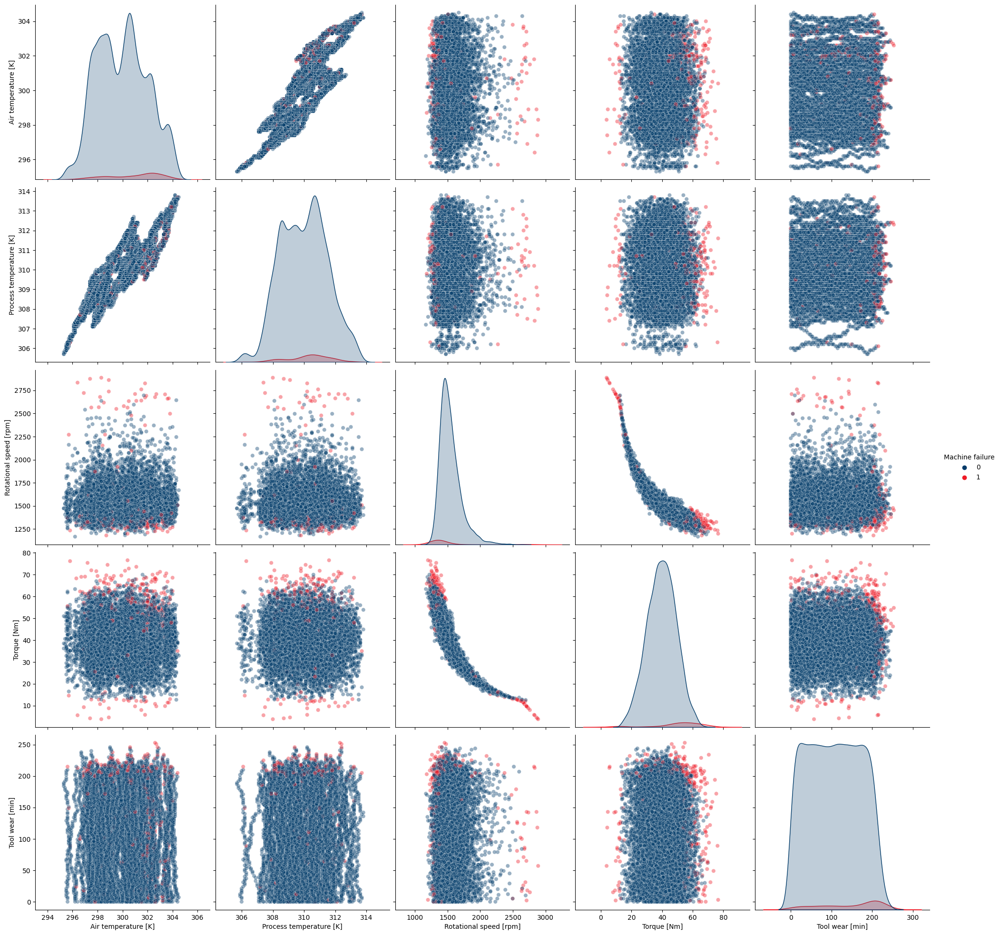

In [9]:
sns.pairplot(original, hue='Machine failure', vars=numeric_cols, height=4, palette=bosch, plot_kws={'alpha': 0.4})
plt.show()

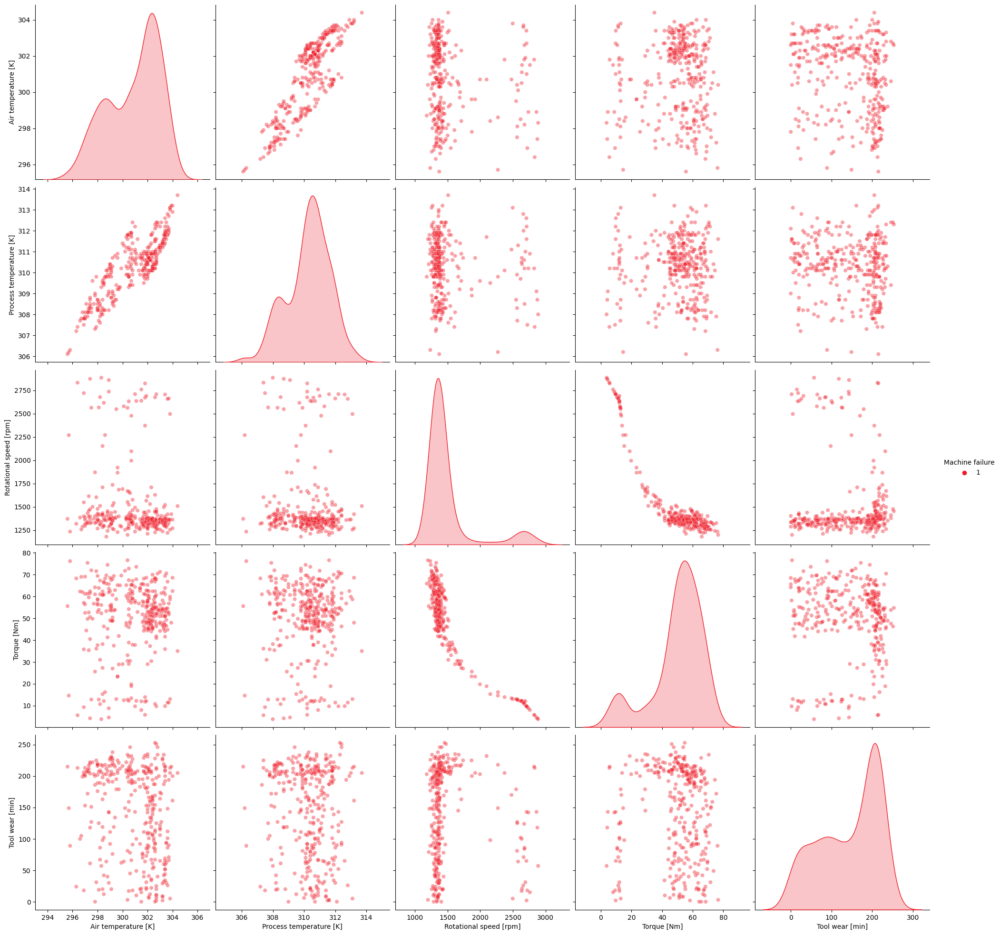

In [10]:
sns.pairplot(original[original['Machine failure'] == 1], hue='Machine failure', vars=numeric_cols, height=4, palette=[bosch[1]], plot_kws={'alpha': 0.4})
plt.show()

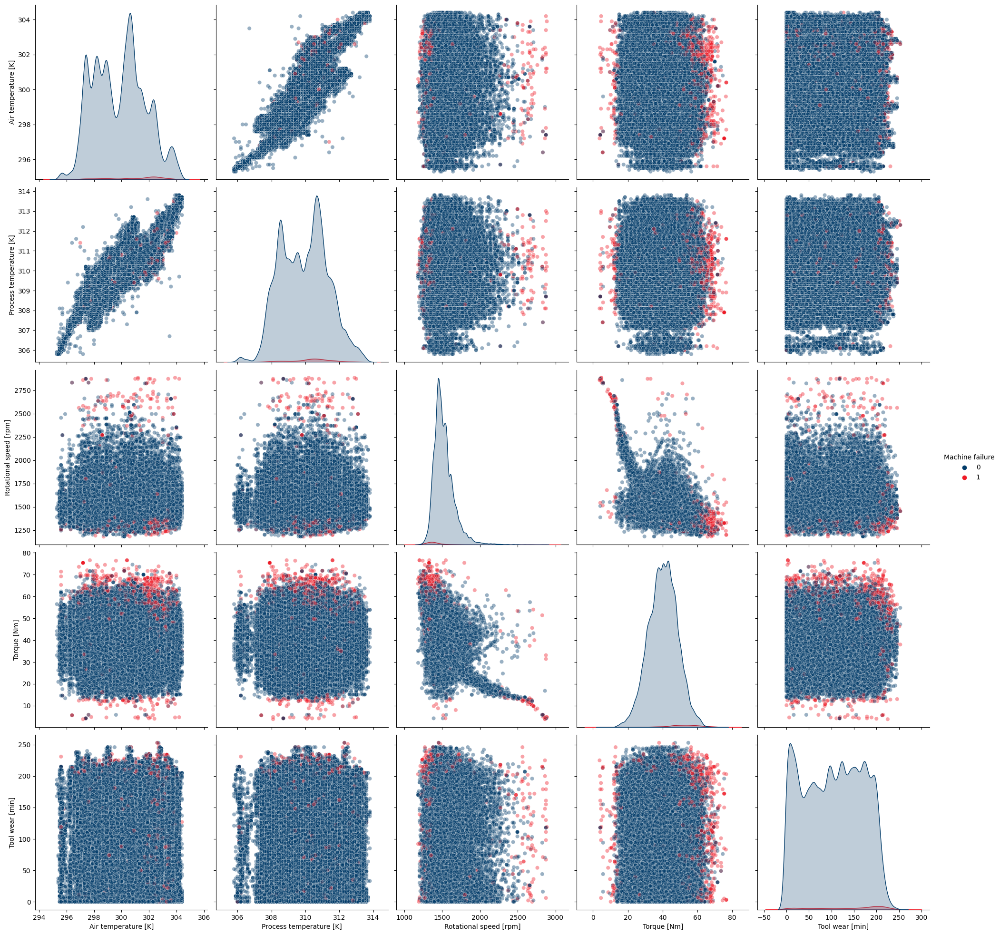

In [11]:
sns.pairplot(train, hue='Machine failure', vars=numeric_cols, height=4, palette=bosch, plot_kws={'alpha': 0.4})
plt.show()

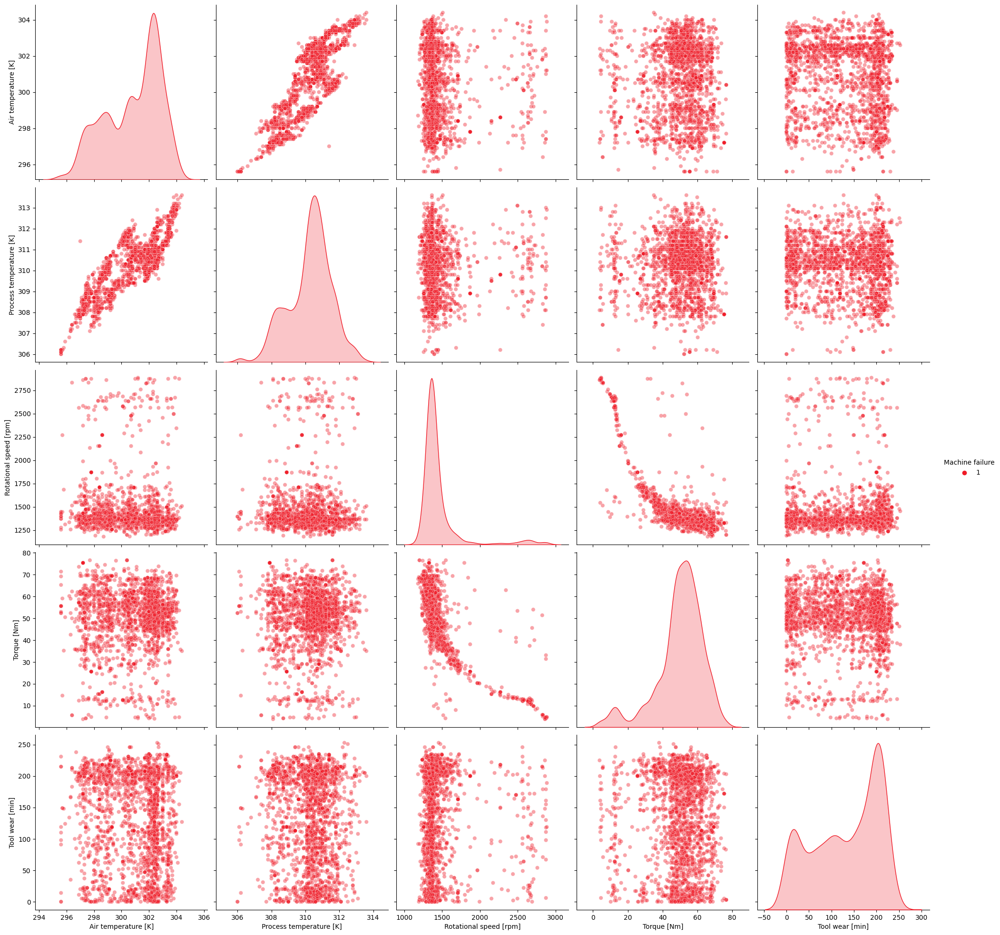

In [12]:
sns.pairplot(train[train['Machine failure'] == 1], hue='Machine failure', vars=numeric_cols, height=4, palette=[bosch[1]], plot_kws={'alpha': 0.4})
plt.show()

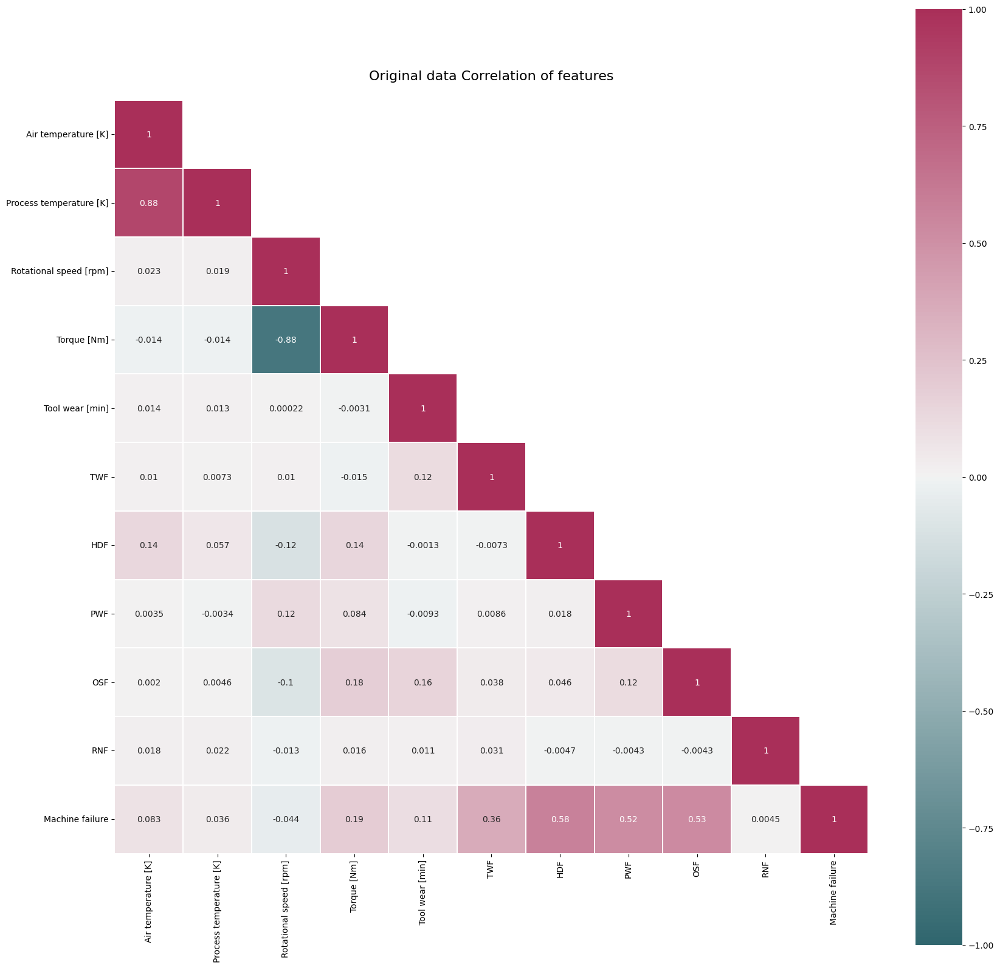

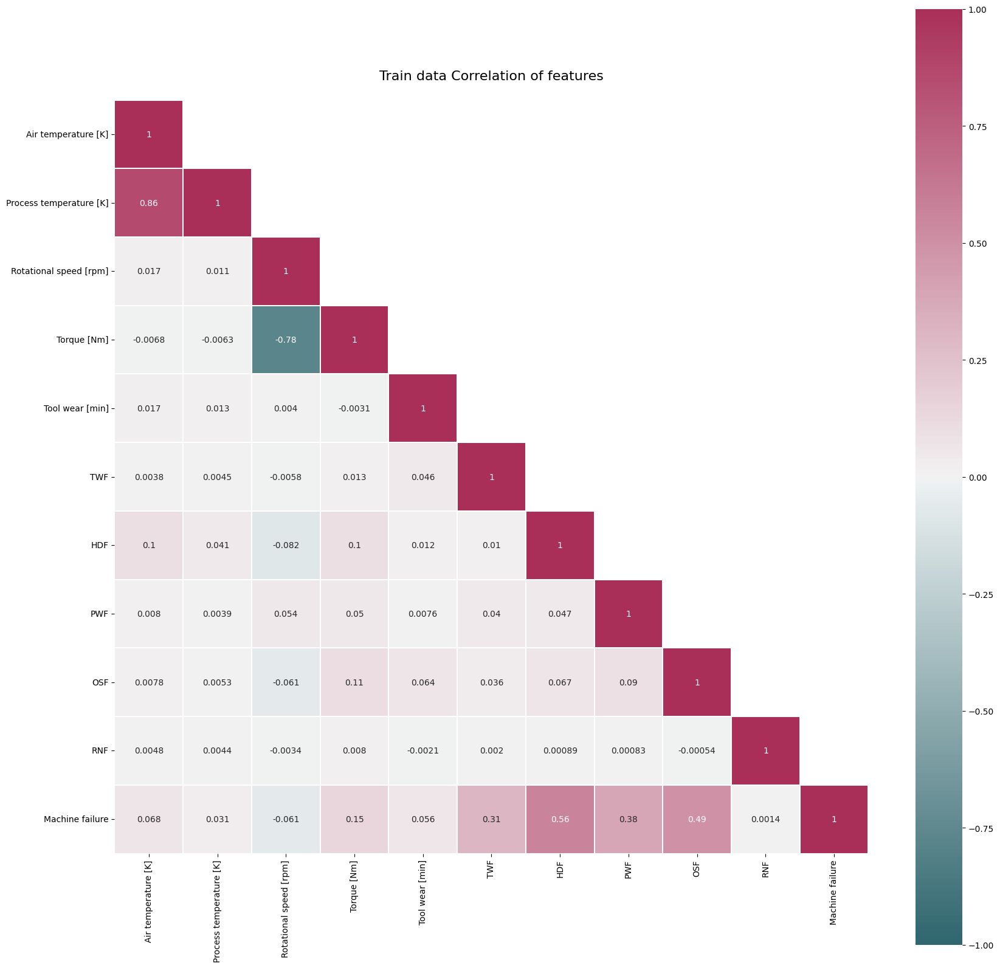

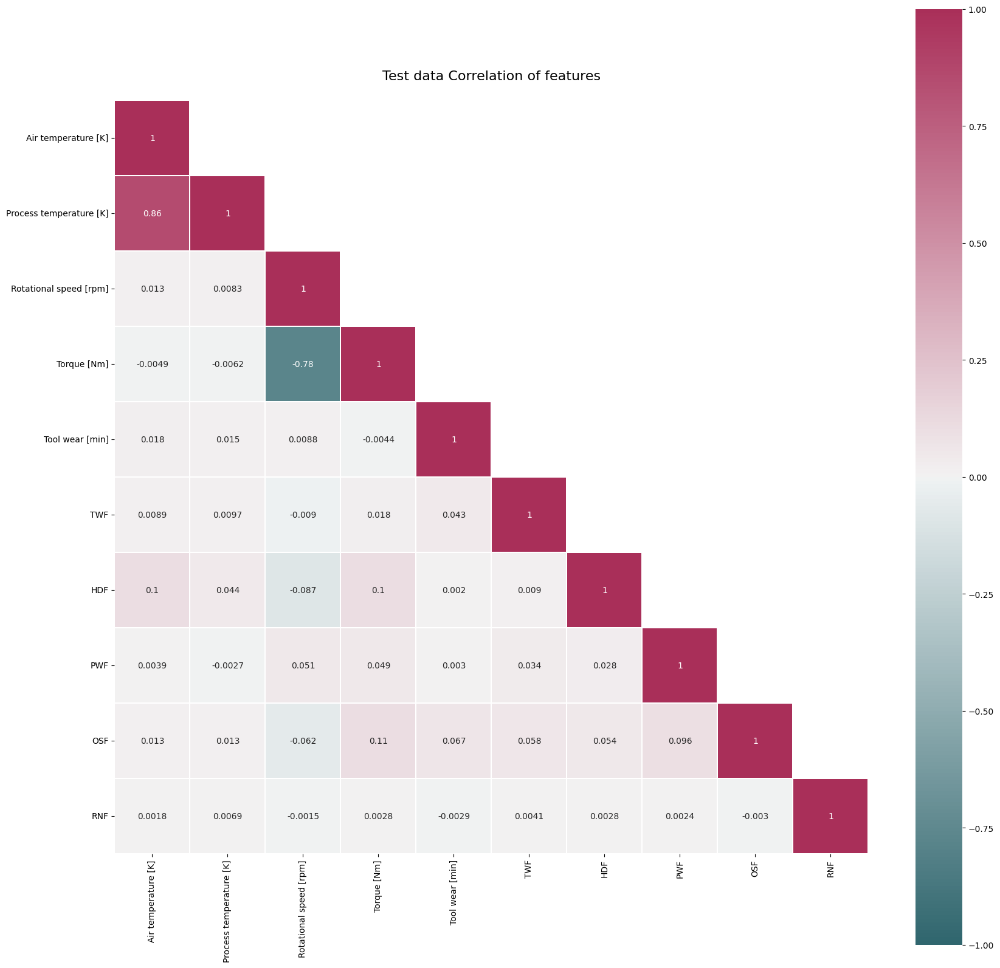

In [42]:
def plot_heatmap(df, title):
    # Create a mask for the diagonal elements
    mask = np.zeros_like(df.astype(float).corr())
    mask[np.triu_indices_from(mask, k=1)] = True

    # Set the colormap and figure size
    colormap = sns.diverging_palette(207, 357, s=75, l=40, n=25, center='light', as_cmap=True)

    # Plot the heatmap with the masked diagonal elements
    plt.figure(figsize=(20, 20))
    sns.heatmap(df.astype(float).corr(), linewidths=0.1, vmax=1.0, vmin=-1.0, 
                square=True, cmap=colormap, linecolor='white', annot=True, mask=mask)
    plt.title(f'{title} Correlation of features', y=1.02, size=16)
    plt.show()

plot_heatmap(original[numeric_cols+binary_cols+[target]], title='Original data')
plot_heatmap(train[numeric_cols+binary_cols+[target]], title='Train data')
plot_heatmap(test[numeric_cols+binary_cols], title='Test data')

### Feature Engineering

In [43]:
# Concatenate the training dataset and the original rows where "Machine failure" is "1" since the dataset is imbalanced.
original_only_failures = original[original['Machine failure'] == 1].drop('UDI', axis=1)
all_data = pd.concat([train, original_only_failures], ignore_index=True)
all_data = all_data.drop_duplicates()
original_only_failures

,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
50,L47230,L,298.9,309.1,2861,4.6,143,1,0,0,1,0,0
69,L47249,L,298.9,309.0,1410,65.7,191,1,0,0,1,1,0
77,L47257,L,298.8,308.9,1455,41.3,208,1,1,0,0,0,0
160,L47340,L,298.4,308.2,1282,60.7,216,1,0,0,0,1,0
161,L47341,L,298.3,308.1,1412,52.3,218,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9758,L56938,L,298.6,309.8,2271,16.2,218,1,1,0,0,0,0
9764,L56944,L,298.5,309.5,1294,66.7,12,1,0,0,1,0,0
9822,L57002,L,298.5,309.4,1360,60.9,187,1,0,0,0,1,0
9830,L57010,L,298.3,309.3,1337,56.1,206,1,0,0,0,1,0


In [44]:
def feature_engineering(df): 
    # Create interaction features
    df['Temperature_Torque_Interaction'] = df['Process temperature [K]'] * df['Torque [Nm]']
    df['Speed_Torque_Interaction']       = df['Rotational speed [rpm]']  * df['Torque [Nm]']
    df['Temperature_Speed_Interaction']  = df['Process temperature [K]'] * df['Rotational speed [rpm]']
    df['Sum_Binary_features']            = df['TWF'] + df['HDF'] + df['PWF'] + df['OSF'] + df['RNF']
    # Create time-based features
    df['Tool_Usage_Duration']            = df.groupby('Product ID')['Tool wear [min]'].transform(lambda x: x.max() - x.min())
    df['Average_Temperature']            = df.groupby('Product ID')['Process temperature [K]'].transform('mean')
    df['Maximum_Torque']                 = df.groupby('Product ID')['Torque [Nm]'].transform('max')
    return df

new_cols = ['Temperature_Torque_Interaction', 'Speed_Torque_Interaction', 'Temperature_Speed_Interaction',
             'Sum_Binary_features', 'Tool_Usage_Duration', 'Average_Temperature', 'Maximum_Torque']
numeric_cols = numeric_cols + new_cols
numeric_cols

['Air temperature [K]',
 'Process temperature [K]',
 'Rotational speed [rpm]',
 'Torque [Nm]',
 'Tool wear [min]',
 'Temperature_Torque_Interaction',
 'Speed_Torque_Interaction',
 'Temperature_Speed_Interaction',
 'Sum_Binary_features',
 'Tool_Usage_Duration',
 'Average_Temperature',
 'Maximum_Torque']

In [45]:
all_data = feature_engineering(all_data)
test     = feature_engineering(test)
all_data.head(3)

In [25]:
all_data.drop(columns=['id', 'PWF', 'HDF', 'TWF', 'OSF'], inplace=True, axis=1)
test.drop(columns= ['id', 'PWF', 'HDF', 'TWF', 'OSF'], inplace=True, axis=1)
all_data.head(3)

,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,RNF,Temperature_Torque_Interaction,Speed_Torque_Interaction,Temperature_Speed_Interaction,Sum_Binary_features,Tool_Usage_Duration,Average_Temperature,Maximum_Torque
0,L50096,L,300.6,309.6,1596,36.1,140,0,0,11176.56,57615.6,494121.6,0,172,309.54800,50.2
1,M20343,M,302.6,312.1,1759,29.1,200,0,0,9082.11,51186.9,548983.9,0,200,312.17000,54.6
2,L49454,L,299.3,308.5,1805,26.5,25,0,0,8175.25,47832.5,556842.5,0,173,308.59697,54.3


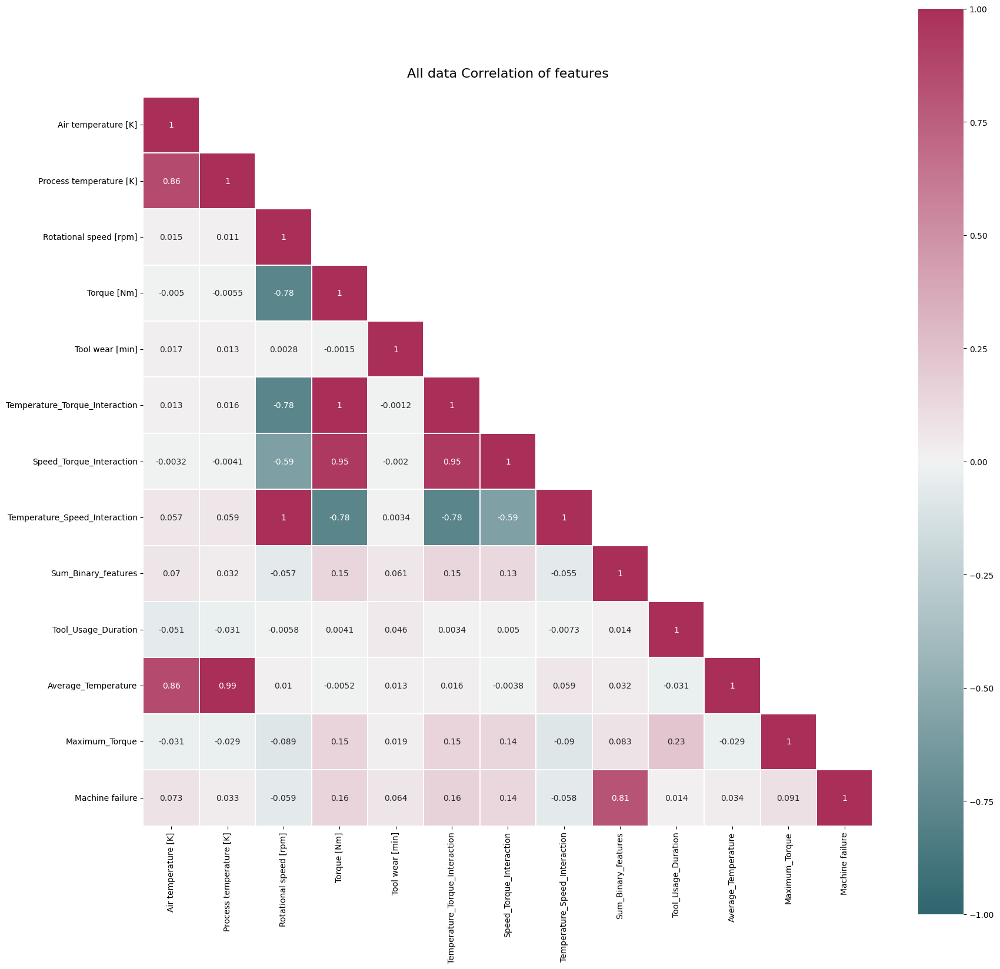

In [50]:
# corr_mat_data = all_data[[target] + numeric_cols].corr()

# data_mask = np.triu(np.zeros_like(corr_mat_data, dtype=bool), 1)
# colormap = sns.diverging_palette(207, 357, s=75, l=40, n=25, center='light', as_cmap=True)

# plt.figure(figsize=(20, 20))
# sns.heatmap(corr_mat_data, linewidths=0.1, vmax=1.0, vmin=-1.0, 
#             square=True, cmap=colormap, linecolor='white', annot=True, mask=data_mask)
# plt.title(f'All_data Correlation of features', y=1.02, size=16)
# plt.show()

# def plot_heatmap(df, title):
#     # Create a mask for the diagonal elements
#     mask = np.zeros_like(df.astype(float).corr())
#     mask[np.triu_indices_from(mask, k=1)] = True

#     # Set the colormap and figure size
#     colormap = sns.diverging_palette(207, 357, s=75, l=40, n=25, center='light', as_cmap=True)

#     # Plot the heatmap with the masked diagonal elements
#     plt.figure(figsize=(20, 20))
#     sns.heatmap(df.astype(float).corr(), linewidths=0.1, vmax=1.0, vmin=-1.0, 
#                 square=True, cmap=colormap, linecolor='white', annot=True, mask=mask)
#     plt.title(f'{title} Correlation of features', y=1.02, size=16)
#     plt.show()

plot_heatmap(all_data[numeric_cols+[target]], title='All data')

**There is a strong correlation between the new feature "Sum_Binary_features" and the "Machine Failure".**

### CatBoost Model Building

In [ ]:
X  = all_data.drop(columns=['Machine failure'], axis=1)
y  = all_data['Machine failure']
X.head()

In [ ]:
submission = pd.read_csv('./sample_submission.csv')
test_id = submission['id']

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)
features_names_list = X_train.columns.tolist()
features_names_list

train_pool = Pool(X_train.to_numpy(), y_train.to_numpy(), feature_names=features_names_list, cat_features=['Type', 'Product ID'])
val_pool   = Pool(X_val.to_numpy(), y_val.to_numpy(),     feature_names=features_names_list, cat_features=['Type', 'Product ID'])

test_pool  = Pool(test.to_numpy(),                        feature_names=features_names_list, cat_features=['Type', 'Product ID'])

X_pool     = Pool(X.to_numpy(), y.to_numpy(),             feature_names=features_names_list, cat_features=['Type', 'Product ID'])

In [ ]:
model = CatBoostClassifier(learning_rate=0.1, iterations=500, random_seed=42)
model.fit(X_train, y_train,
          cat_features=[0, 1],
          eval_set=(X_val, y_val),
          verbose=False,
          plot=True)

In [ ]:
print("Train AUC :", roc_auc_score(y_val, model.predict_proba(X_val)[:,1]))

In [ ]:
predictions = model.predict_proba(test)[:,1]
pd.DataFrame(
    {'ID': test_id, 'Machine failure': predictions}
).to_csv(
    'CatBoost_base_submission.csv', index=False
)

In [ ]:
params ={'loss_function': 'Logloss',
         'eval_metric': 'AUC',
         'random_seed': 42,
         'learning_rate': 0.027, 
          'iterations': 927, 
          'depth': 5, 
          'subsample': 0.705
        }

earlystop_params = params.copy()
earlystop_params.update({
    'od_type': 'Iter',
    'od_wait': 60
})

model2 = CatBoostClassifier(**earlystop_params)
model2.fit(train_pool, eval_set=val_pool, verbose=50, plot=True)

In [ ]:
print("Train AUC :", roc_auc_score(y_val, model2.predict_proba(X_val)[:,1]))

In [ ]:
feature_importances = model2.get_feature_importance(train_pool)
feature_names = X_train.columns
for score, name in sorted(zip(feature_importances, feature_names), reverse=True):
    print('{}: {}'.format(name, score))

In [ ]:
# Create a dataframe with feature names and their importance scores
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})

# Sort the dataframe by importance scores in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=True)  # Sort in ascending order

# Create a vertical bar plot of feature importance
plt.figure(figsize=(6, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

In [ ]:
predictions2 = model2.predict_proba(test_pool)[:,1]
pd.DataFrame(
    {'ID':test_id, 'Machine failure':predictions2}
).to_csv(
    'CatBoost_submission_base2.csv', index=False
)

### Bagging

In [ ]:
predictions3 = []

for i in range(10):
    clf = CatBoostClassifier(**earlystop_params, logging_level='Silent')
    clf.fit(train_pool, eval_set=val_pool)
    predictions3.append(clf.predict_proba(test_pool)[:,1])
    
predictions3

In [ ]:
print("Train AUC :", roc_auc_score(y_val, clf.predict_proba(X_val)[:,1]))

In [ ]:
prediction3 = np.mean(predictions3, axis=0)
pd.DataFrame(
    {'ID':test_id, 'Machine failure':prediction3}
).to_csv(
    'Bagging_CatBoost_submission.csv', index=False
)

### Hyperparameters tuning

In [ ]:
# This function will calculate the quality of found hyperparameters on a test dataset:
def calculate_val_quality(train_pool=train_pool, val_pool=val_pool, **kwargs):
    model = CatBoostClassifier(**kwargs, random_seed=42)
    model.fit(train_pool, verbose=100, eval_set=val_pool)
    y_pred = model.predict_proba(val_pool)
    return eval_metric(val_pool.get_label(), y_pred[:, 1], 'AUC')

In [ ]:
calculate_val_quality()

In [ ]:
cat_cv_scores  = list()

def objective(trial):
    params = {
        'eval_metric': 'AUC',
        'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.3),
        'depth': trial.suggest_int('depth', 3, 15),
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1, 10),
        'boosting_type': 'Ordered',
        'max_ctr_complexity': trial.suggest_int('max_ctr_complexity', 0, 8),
        'iterations': trial.suggest_int('iterations', 300, 1000),
        'subsample': trial.suggest_float('subsample', 0.1, 0.9)
    }
    
    earlystop_params = params.copy()
    earlystop_params.update({
        'od_type': 'Iter',
        'od_wait': 60
    })
    
    skf = StratifiedKFold(n_splits=5, random_state=42, shuffle=True)
    
    for i, (train_ix, test_ix) in enumerate(skf.split(X_train, y_train)):
        
        print("=======================================================================")
        
        X_traino, X_testo = X_train.iloc[train_ix], X_train.iloc[test_ix]
        y_traino, y_testo = y_train.iloc[train_ix], y_train.iloc[test_ix]
        
        traino_pool = Pool(X_traino.to_numpy(), y_traino.to_numpy(), feature_names=features_names_list, cat_features=['Type', 'Product ID'])
        testo_pool  = Pool(X_testo.to_numpy(),  y_testo.to_numpy(),  feature_names=features_names_list, cat_features=['Type', 'Product ID'])

        optuna_model = CatBoostClassifier(**earlystop_params, random_seed=42)
        optuna_model.fit(traino_pool, verbose=0, eval_set=testo_pool)
        
        y_pred = optuna_model.predict_proba(testo_pool)
        cat_score_fold = eval_metric(testo_pool.get_label(), y_pred[:, 1], 'AUC')   
        cat_cv_scores.append(cat_score_fold)

        print('Fold N°', i, '==> CatBoost       - AUC: ====>', cat_score_fold)
    
    return np.mean(cat_cv_scores)

sampler = TPESampler(seed=123)
study = optuna.create_study(direction='maximize', sampler=sampler)
study.optimize(objective, n_trials=5) # 15

In [ ]:
# best_params = {'learning_rate': 0.15993386077870966,
#                  'depth': 9,
#                  'l2_leaf_reg': 6.70960862696189,
#                  'max_ctr_complexity': 7,
#                  'iterations': 807,
#                  'subsample': 0.5888188085420664}
best_params = {'learning_rate': 0.20924428649376062,
               'depth': 6,
               'l2_leaf_reg': 3.041663082077828,
               'max_ctr_complexity': 4,
               'iterations': 804,
               'subsample': 0.43848516809956883}

In [ ]:
best_cat_cv_scores, best_cat_preds = list(), list()
skf = StratifiedKFold(n_splits=5, random_state=42, shuffle=True)
    
for i, (train_ix, test_ix) in enumerate(skf.split(X_train, y_train)):

    X_traino, X_testo = X_train.iloc[train_ix], X_train.iloc[test_ix]
    y_traino, y_testo = y_train.iloc[train_ix], y_train.iloc[test_ix]

    traino_pool = Pool(X_traino.to_numpy(), y_traino.to_numpy(), feature_names=features_names_list, cat_features=['Type', 'Product ID'])
    testo_pool  = Pool(X_testo.to_numpy(),  y_testo.to_numpy(),  feature_names=features_names_list, cat_features=['Type', 'Product ID'])


    best_optuna_model = CatBoostClassifier(**best_params, random_seed=42)
    best_optuna_model.fit(traino_pool, verbose=0, eval_set=testo_pool)

    y_pred = best_optuna_model.predict_proba(testo_pool)
    cat_score_fold = eval_metric(testo_pool.get_label(), y_pred[:, 1], 'AUC')   
    best_cat_cv_scores.append(cat_score_fold)

    print('Fold N°', i, '==> CatBoost       -Best AUC: ====>', cat_score_fold)

print("Best score: =====>", np.mean(best_cat_cv_scores))

In [ ]:
best_optuna_predictions = best_optuna_model.predict_proba(test)[:,1]
pd.DataFrame(
    {'ID':test_id, 'Machine failure': best_optuna_predictions}
).to_csv(
    'Best_Optuna_CatBoost_submission_v2.csv', index=False
)